In [ ]:
pip install nilearn bdpy

In [ ]:
SUBJECT = "subj01"

# !mkdir -p data

# !curl -L -o data/{SUBJECT}_T1wAligned.nii https://ndownloader.figshare.com/files/14090069

In [ ]:
# %%
import matplotlib as mpl
import matplotlib.pyplot as plt
import nibabel as nib
import numpy as np
from nilearn import plotting
from nilearn.image import resample_to_img
from scipy import ndimage

%matplotlib inline

mpl.rcParams.update({
    'font.family'    : 'sans-serif',
    'font.sans-serif': ['Helvetica', 'Arial', 'Nimbus Sans', 'DejaVu Sans'],
    'axes.titlesize' : 14,
    'axes.labelsize' : 12,
    'figure.dpi'     : 300,
    'svg.fonttype'   : 'none',  # text stays editable in Illustrator/Inkscape
})

SUBJECT = 'subj01'
MRIDIR  = f'/home/ec2-user/Brain2VLM/mrifeat/{SUBJECT}'
ROI_DIR = f'/home/ec2-user/Brain2VLM/nsd/nsddata/ppdata/{SUBJECT}/func1pt8mm/roi/'
ANAT    = f'data/{SUBJECT}_T1wAligned.nii'

In [ ]:
# Load streams ROI mask
# NSD streams labels: 1=early, 2=midventral, 3=midlateral,
#                     4=midparietal, 5=ventral, 6=lateral, 7=parietal
streams_img  = nib.load(ROI_DIR + 'streams.nii.gz')
streams_data = streams_img.get_fdata()
print('streams unique values:', np.unique(streams_data[streams_data > 0]).astype(int))

EARLY_LABEL   = 1
VENTRAL_LABEL = 5

# %%
# Load betas and average over samples → (n_voxels,)
early_mean   = np.mean(np.load(f'{MRIDIR}/{SUBJECT}_early_betas_ave_te.npy'),   axis=0)
ventral_mean = np.mean(np.load(f'{MRIDIR}/{SUBJECT}_ventral_betas_ave_te.npy'), axis=0)

print(f'early   betas: {early_mean.shape[0]} voxels  |  mask: {(streams_data == EARLY_LABEL).sum().astype(int)}')
print(f'ventral betas: {ventral_mean.shape[0]} voxels  |  mask: {(streams_data == VENTRAL_LABEL).sum().astype(int)}')

# %%
# Build 3D NIfTI volumes from betas + streams mask
def build_volume(betas_mean, label, streams_data, streams_img):
    coords = np.argwhere(streams_data == label)
    assert len(coords) == len(betas_mean), \
        f'Mismatch: mask={len(coords)} voxels, betas={len(betas_mean)}'
    vol = np.zeros(streams_data.shape, dtype=np.float32)
    for idx, (i, j, k) in enumerate(coords):
        vol[i, j, k] = betas_mean[idx]
    return nib.Nifti1Image(vol, streams_img.affine)

early_vol   = build_volume(early_mean,   EARLY_LABEL,   streams_data, streams_img)
ventral_vol = build_volume(ventral_mean, VENTRAL_LABEL, streams_data, streams_img)

In [ ]:
# Figure 1 & 2 — ortho views saved as SVG
def get_cut_coords(vol_img):
    data = vol_img.get_fdata()
    com  = ndimage.center_of_mass(data > 0)
    mni  = vol_img.affine[:3, :3].dot(com) + vol_img.affine[:3, 3]
    return tuple(mni.astype(int))

early_cuts   = get_cut_coords(early_vol)
ventral_cuts = (-35, get_cut_coords(ventral_vol)[1], get_cut_coords(ventral_vol)[2])

early_thresh   = max(0, np.percentile(early_mean[early_mean > 0],     25))
ventral_thresh = max(0, np.percentile(ventral_mean[ventral_mean > 0], 25))

def save_roi_figure(vol, anat, cuts, title, cmap, threshold, vmax, filename):
    fig = plt.figure(figsize=(14, 4))
    display = plotting.plot_anat(anat, cut_coords=cuts, display_mode='ortho',
                                  title=title, figure=fig)
    display.add_overlay(vol, cmap=cmap, alpha=0.8, threshold=threshold, vmax=vmax)

    panel_labels = [
        ('P', 'A', 'S', 'I'),  # sagittal
        ('R', 'L', 'S', 'I'),  # coronal
        ('R', 'L', 'A', 'P'),  # axial
    ]
    for ax, (left, right, top, bottom) in zip(fig.get_axes()[:3], panel_labels):
        kw = dict(fontsize=9, color='white', fontweight='bold',
                  transform=ax.transAxes, va='center', ha='center')
        ax.text(0.03, 0.5,  left,   **kw)
        ax.text(0.97, 0.5,  right,  **kw)
        ax.text(0.5,  0.97, top,    **kw)
        ax.text(0.5,  0.03, bottom, **kw)

    # fig.savefig(filename, format='svg', bbox_inches='tight',
    #             facecolor='black', edgecolor='none')
    # print(f'Saved: {filename}')
    plt.show()

# save_roi_figure(early_vol, ANAT, early_cuts,
#                 title='Early Visual Cortex — V1 / V2 / V3',
#                 cmap='hot',  threshold=early_thresh,
#                 vmax=np.percentile(early_mean[early_mean > 0], 90),
#                 filename='early_visual_cortex.svg')

# save_roi_figure(ventral_vol, ANAT, ventral_cuts,
#                 title='Ventral Visual Cortex — V4 / LO / PHC',
#                 cmap='cool', threshold=ventral_thresh,
#                 vmax=np.percentile(ventral_mean[ventral_mean > 0], 90),
#                 filename='ventral_visual_cortex.svg')

# %%

Saved: roi_grid_hierarchy.svg


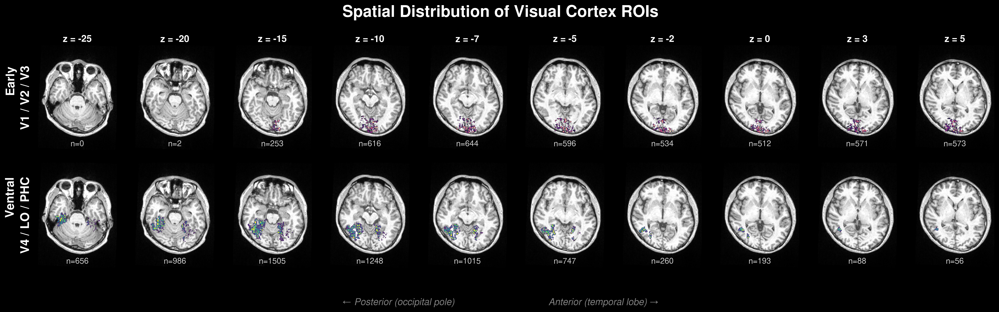

In [ ]:
# Figure 3 — grid of axial slices showing spatial hierarchy
anat_img  = nib.load(ANAT)
anat_data = anat_img.get_fdata()
anat_aff  = anat_img.affine

def mni_z_to_vox(z_mni, affine):
    inv = np.linalg.inv(affine)
    return int(np.round(inv[2, 2] * z_mni + inv[2, 3]))

def get_anat_slice(z_mni):
    vox = np.clip(mni_z_to_vox(z_mni, anat_aff), 0, anat_data.shape[2]-1)
    return np.rot90(anat_data[:, :, vox])

# Resample functional volumes to anat space — prevents overlay clipping
early_vol_r   = resample_to_img(early_vol,   anat_img, interpolation='linear')
ventral_vol_r = resample_to_img(ventral_vol, anat_img, interpolation='linear')

z_slices = [-25, -20, -15, -10, -5, -2, 0, 3, 5]

row_configs = [
    (early_vol_r,   early_mean,   'magma',  'Early\nV1 / V2 / V3',
     max(0, np.percentile(early_mean[early_mean > 0],     25)),
     np.percentile(early_mean[early_mean > 0],            90)),
    (ventral_vol_r, ventral_mean, 'viridis', 'Ventral\nV4 / LO / PHC',
     max(0, np.percentile(ventral_mean[ventral_mean > 0], 25)),
     np.percentile(ventral_mean[ventral_mean > 0],        90)),
]

fig, axes = plt.subplots(2, len(z_slices), figsize=(26, 6))
fig.patch.set_facecolor('black')
plt.subplots_adjust(wspace=0.04, hspace=0.12)

for row, (vol_img, mean_arr, cmap, row_label, thresh, vmax) in enumerate(row_configs):
    vol_data = vol_img.get_fdata()

    for col, z_mni in enumerate(z_slices):
        ax = axes[row, col]
        ax.set_facecolor('black')

        anat_sl = get_anat_slice(z_mni)
        ax.imshow(anat_sl, cmap='gray', origin='upper',
                  vmin=np.percentile(anat_data, 2),
                  vmax=np.percentile(anat_data, 98))

        vox     = np.clip(mni_z_to_vox(z_mni, anat_img.affine), 0, vol_data.shape[2]-1)
        func_sl = np.rot90(vol_data[:, :, vox]).copy()
        ax.imshow(np.ma.masked_less(func_sl, thresh), cmap=cmap, alpha=0.9,
                  origin='upper', vmin=thresh, vmax=vmax)

        n_active = int((func_sl >= thresh).sum())
        ax.text(0.5, 0.02, f'n={n_active}', color='white', fontsize=12,
                transform=ax.transAxes, ha='center', va='bottom', alpha=0.8)
        ax.axis('off')

        if row == 0:
            ax.set_title(f'z = {z_mni}', color='white',
                         fontsize=14, fontweight='bold', pad=5)

    axes[row, 0].text(-0.08, 0.5, row_label, color='white', fontsize=18,
                       fontweight='bold', transform=axes[row, 0].transAxes,
                       ha='right', va='center', rotation=90, linespacing=1.5)

fig.text(0.5, -0.02,
         '← Posterior (occipital pole)                                    Anterior (temporal lobe) →',
         color='gray', fontsize=14, ha='center', style='italic')
fig.suptitle('Spatial Distribution of Visual Cortex ROIs',
             color='white', fontsize=24, fontweight='bold', y=1.02)

# fig.savefig('roi_grid_hierarchy.svg', format='svg', bbox_inches='tight',
#             facecolor='black', edgecolor='none')
print('Saved: roi_grid_hierarchy.svg')
plt.show()

Saved: roi_grid_heatmap_trend.svg


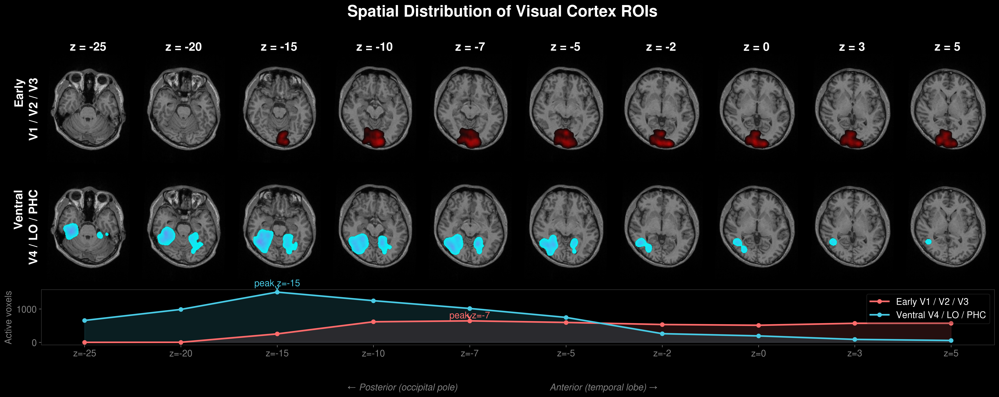

In [11]:
# %%
from scipy.ndimage import gaussian_filter

def get_smooth_slice(vol_img, z_mni, sigma=4):
    data = vol_img.get_fdata()
    vox  = np.clip(mni_z_to_vox(z_mni, vol_img.affine), 0, data.shape[2]-1)
    sl   = np.rot90(data[:, :, vox]).copy()
    sl[sl < 0] = 0
    return gaussian_filter(sl, sigma=sigma)

glow_configs = [
    (early_vol_r,   early_mean,   'hot',  'Early\nV1 / V2 / V3'),
    (ventral_vol_r, ventral_mean, 'cool', 'Ventral\nV4 / LO / PHC'),
]

# Pre-compute voxel counts per slice per ROI (on unsmoothed data for accuracy)
counts = {}
for vol_img, mean_arr, cmap, label in glow_configs:
    thresh = np.percentile(mean_arr[mean_arr > 0], 25)
    vol_data = vol_img.get_fdata()
    ns = []
    for z_mni in z_slices:
        vox = np.clip(mni_z_to_vox(z_mni, vol_img.affine), 0, vol_data.shape[2]-1)
        sl  = np.rot90(vol_data[:, :, vox]).copy()
        ns.append(int((sl >= thresh).sum()))
    counts[label] = ns

# ---- Layout: 2 brain rows + 1 trend row ----
fig = plt.figure(figsize=(26, 8))
fig.patch.set_facecolor('black')

gs = fig.add_gridspec(3, len(z_slices),
                      height_ratios=[4, 4, 2],
                      hspace=0.08, wspace=0.02)

brain_axes = [[fig.add_subplot(gs[r, c]) for c in range(len(z_slices))]
              for r in range(2)]
trend_ax   = fig.add_subplot(gs[2, :])   # full-width trend panel

# ---- Brain rows ----
for row, (vol_img, mean_arr, cmap, row_label) in enumerate(glow_configs):
    vmax = np.percentile(mean_arr[mean_arr > 0], 95)

    for col, z_mni in enumerate(z_slices):
        ax = brain_axes[row][col]
        ax.set_facecolor('black')

        anat_sl = get_anat_slice(z_mni)
        ax.imshow(anat_sl, cmap='gray', origin='upper',
                  vmin=np.percentile(anat_data, 2),
                  vmax=np.percentile(anat_data, 99) * 1.8)

        func_sl     = get_smooth_slice(vol_img, z_mni, sigma=4)
        noise_floor = vmax * 0.03
        ax.imshow(np.ma.masked_less(func_sl, noise_floor), cmap=cmap,
                  origin='upper', vmin=noise_floor, vmax=vmax,
                  alpha=0.92, interpolation='bilinear')

        ax.axis('off')
        if row == 0:
            ax.set_title(f'z = {z_mni}', color='white',
                         fontsize=18, fontweight='bold', pad=5)

    brain_axes[row][0].text(
        -0.08, 0.5, row_label, color='white', fontsize=18, fontweight='bold',
        transform=brain_axes[row][0].transAxes,
        ha='right', va='center', rotation=90, linespacing=1.5)

# ---- Trend row ----
trend_ax.set_facecolor('black')

early_color   = '#ff6b6b'   # warm red matching 'hot'
ventral_color = '#48cae4'   # cyan matching 'cool'

for (_, _, _, label), color, ls in zip(
        glow_configs,
        [early_color, ventral_color],
        ['-', '-']):
    ns = counts[label]
    trend_ax.plot(range(len(z_slices)), ns, color=color,
                  linewidth=2.5, marker='o', markersize=6,
                  label=label.replace('\n', ' '))
    trend_ax.fill_between(range(len(z_slices)), ns,
                          alpha=0.15, color=color)

trend_ax.set_xticks(range(len(z_slices)))
trend_ax.set_xticklabels([f'z={z}' for z in z_slices],
                          color='gray', fontsize=30)
trend_ax.set_ylabel('Active voxels', color='gray', fontsize=14)
trend_ax.tick_params(colors='gray', labelsize=14)
trend_ax.legend(fontsize=14, framealpha=0.2,
                labelcolor='white', facecolor='black', edgecolor='gray',
                loc='upper right')
for spine in trend_ax.spines.values():
    spine.set_edgecolor('#333333')
trend_ax.tick_params(axis='y', colors='gray')
trend_ax.yaxis.label.set_color('gray')

# Annotate peak of each curve
for (_, _, _, label), color in zip(glow_configs, [early_color, ventral_color]):
    ns    = counts[label]
    peak  = int(np.argmax(ns))
    trend_ax.annotate(f'peak z={z_slices[peak]}',
                      xy=(peak, ns[peak]),
                      xytext=(peak, ns[peak] + max(counts[label]) * 0.12),
                      color=color, fontsize=14, ha='center',
                      arrowprops=dict(arrowstyle='->', color=color, lw=1.2))

fig.text(0.5, -0.01,
         '← Posterior (occipital pole)                                    Anterior (temporal lobe) →',
         color='gray', fontsize=14, ha='center', style='italic')
fig.suptitle('Spatial Distribution of Visual Cortex ROIs',
             color='white', fontsize=24, fontweight='bold', y=1.01)

fig.savefig('roi_grid_heatmap_trend.svg', format='svg', bbox_inches='tight',
            facecolor='black', edgecolor='none')
print('Saved: roi_grid_heatmap_trend.svg')
plt.show()